In [1]:
import ray_tracing_cuda_float_torch as rt
import numpy as np
import torch
import matplotlib.pyplot as plt
import scipy.optimize as so
from skimage.data import shepp_logan_phantom
from skimage.transform import resize
from algorithms import Algorithms
import time
import pywt
from skimage.metrics import peak_signal_noise_ratio as psnr
import imageio.v3 as iio


In [2]:
device = torch.device( 'cuda' if torch.cuda.is_available() else 'cpu' )

phantom_np = shepp_logan_phantom()

img = torch.tensor( phantom_np, dtype = torch.float32, device = device )

n = img.shape[ 0 ]
( radon, radon_transpose ) = rt.make_radon_transp(
    ( n, n ),
    sino_top_left = ( 0.0, 1.0 ),
    sino_bottom_right = ( torch.pi, -1.0 ),
    img_shape = ( n, n )    
)

In [3]:
b = radon( img )

torch.manual_seed( 42 )
nivel_ruido = 0.05
ruido = torch.randn_like( b ) * nivel_ruido * torch.max( b )
b = b + ruido


In [4]:
def A( x ):
    return radon( x )

def A_transpose( x ):
    return radon_transpose( x )

def ATA( x ):
    return radon_transpose( radon( x ) )


In [5]:
#são adjuntas??

x = torch.randn( *img.shape, device = img.device )
y = torch.randn( *img.shape, device = img.device )

print( ( y * radon( x ) ).sum() )
print( ( x * radon_transpose( y ) ).sum() )

#okay

tensor(34.7839, device='cuda:0')
tensor(34.7839, device='cuda:0')


In [6]:
#vendo se H é adjunta de HT (y'Hx = x'HTy) e se HT é a inversa de H
#deve ser pois H é ortonormal
def H( x, wavelet = 'db5' ):
    #move o tensor da GPU pra CPU e converte para np
    x_np = x.detach().cpu().numpy()
    
    #aplica a transformada wavelet
    coeffs = pywt.wavedec2( x_np, wavelet = wavelet, mode = 'periodization' )
    
    #converte os coeficientes para um array flat e salva os slices
    arr_np, slices = pywt.coeffs_to_array( coeffs )
    
    #retorna o tensor (de volta para a GPU) e a estrutura de slices
    return torch.from_numpy( arr_np ).to( x.device ), slices

def HT( c, slices, wavelet = 'db5' ):
    # c é o tensor dos coeficientes
    #move da GPU para a CPU e converte para np
    c_np = c.detach().cpu().numpy()
    
    #restaura a estrutura de coeficientes usando os slices
    coeffs = pywt.array_to_coeffs( c_np, slices, output_format = 'wavedec2' )
    
    #aplica a transformada inversa
    rec_np = pywt.waverec2( coeffs, wavelet = wavelet, mode = 'periodization' )
    
    #retorna o tensor reconstruído pra GPU
    return torch.from_numpy( rec_np ).to( c.device )

Hx, slices = H( x )
y = torch.randn_like( Hx )

print( torch.sum( y * Hx ) )
print( torch.sum( x * HT( y, slices ) ) )
print( torch.abs( img - HT( H( img )[ 0 ], H( img )[ 1 ] ) ).sum(  ) )

#é adjunta, ortonormal também parece estar ok, já que a soma do erro em toda a imagem é bem pequeno

tensor(-727.6002, device='cuda:0')
tensor(-716.8359, device='cuda:0')
tensor(0.0077, device='cuda:0')


a H não parece ser exatamente a adjunta

In [7]:
def spectral_norm( Q, shape, device = 'cuda', n_iter = 50, tol = 1e-6 ):#método das potências
    v = torch.randn( shape, device = device )
    v = v / torch.norm( v )
    
    lambda_old = 0.0
    
    for i in range( n_iter ):
        # 2. Aplica o operador Q(x) = A'A x
        w = Q( v )
        
        lambda_max = torch.sum( v * w ).item()
        
        v = w / torch.norm(w)
        
        if abs( lambda_max - lambda_old ) < tol:
            break
        lambda_old = lambda_max
            
    return lambda_max

L = spectral_norm( ATA, ( n, n ) )
print( f"Norma Espectral (L): {L}" )
print( f"Passo máximo (1/L): {1/L}" )

Norma Espectral (L): 3.8184821605682373
Passo máximo (1/L): 0.2618841618082059


In [7]:
def f( x ):
    return 1/2 * ( ( A( x ) - b ) ** 2 ).sum()

def grad_f( x ):
    return A_transpose( A( x ) - b )

def g( x, wavelet = 'db5', **kwargs ):
  H_x, _ = H( x, wavelet )
  return torch.sum( torch.abs( H_x ) )

# Encontrando o melhor parâmetro de regularização

[tensor(30.3551, device='cuda:0'), tensor(27.8840, device='cuda:0'), tensor(25.7496, device='cuda:0'), tensor(23.1790, device='cuda:0'), tensor(24.9643, device='cuda:0'), tensor(28.9054, device='cuda:0'), tensor(36.1553, device='cuda:0'), tensor(44.4641, device='cuda:0'), tensor(62.0028, device='cuda:0')]
Gamma ótimo: 0.005
Menor erro absoluto atingido: 23.178974151611328


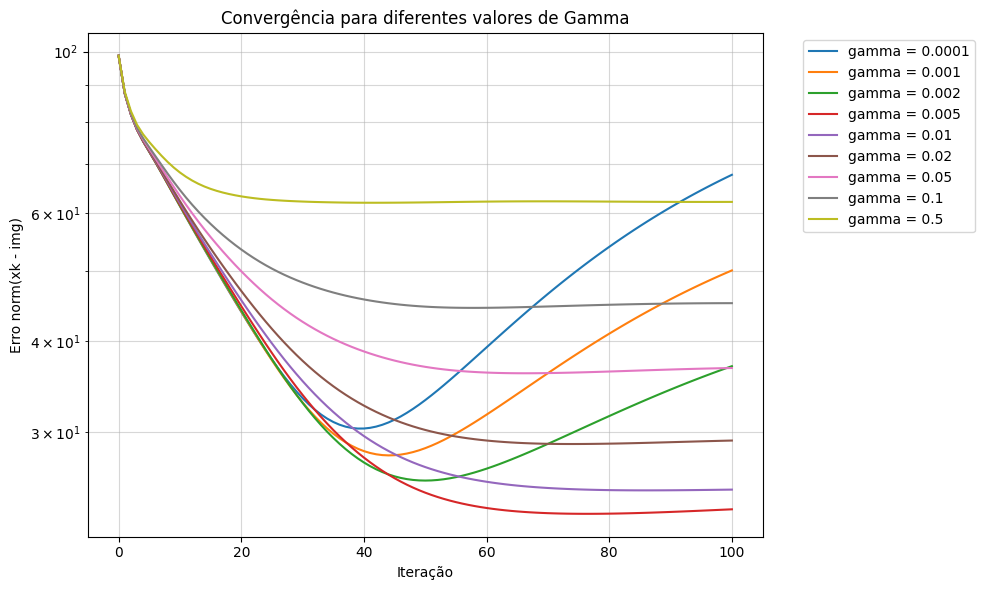

In [13]:
gammas = [ 0.0001, 0.001, 0.002, 0.005, 0.01, 0.02, 0.05, 0.1, 0.5 ]
step = 0.1
x0 = torch.zeros_like( b )
prox = Algorithms.prox_wavelet
tol = 1.0e-10
max_iter = 100 
kwargs = { 'wavelet': 'db5' }

min_errors = []
error_histories = {} 

for gamma in gammas:
    iters = Algorithms.fista_fixo( f = f, grad_f = grad_f, prox = prox, x0 = x0, step = step, 
                                   gamma = gamma, max_iter = max_iter, tol = tol, **kwargs )
    
    errors_k = [ torch.linalg.norm( xk - img ) for xk in iters ]
    
    error_histories[ gamma ] = errors_k 
    min_errors.append( min( errors_k ) )

print( min_errors )
idx_best = torch.argmin( torch.tensor( min_errors ) ).item()
gamma_star = gammas[ idx_best ]

print( f"Gamma ótimo: {gamma_star}" )
print( f"Menor erro absoluto atingido: {min_errors[ idx_best ]}" )

plt.figure( figsize = ( 10, 6 ) )

for gamma in gammas:
    plt.plot( torch.tensor( error_histories[ gamma ] ).to( 'cpu' ), label = f"gamma = {gamma}" )

plt.yscale( 'log' )
plt.xlabel( 'Iteração' )
plt.ylabel( 'Erro norm(xk - img)' )
plt.title( 'Convergência para diferentes valores de Gamma' )
plt.legend( bbox_to_anchor = ( 1.05, 1 ), loc = 'upper left' )
plt.grid( True, which = "both", ls = "-", alpha = 0.5 )
plt.tight_layout()

plt.show()

# Primeiros testes entre todos os algoritmos

In [8]:
def compare_methods( methods, f, F_obj, grad_f, prox, x0, gamma, tol = 1e-4, max_iter = 1000, runs = 5, **kwargs ):
    results = {}
    device = x0.device
    is_cuda = device.type == 'cuda'

    for name, method in methods.items():
        print( f"Testando {name} ({runs} execuções)..." )
        
        _ = method( f = f, x0 = x0, grad_f = grad_f, prox = prox, gamma = gamma, tol = tol, max_iter = max_iter, **kwargs )
        
        times = []
        last_iters = None
        
        for _ in range( runs ):
            if is_cuda:
                torch.cuda.synchronize()
            
            start = time.perf_counter()
            iters = method( f = f, x0 = x0, grad_f = grad_f, prox = prox, gamma = gamma, tol = tol, max_iter = max_iter, **kwargs )
            if is_cuda:
                torch.cuda.synchronize()
            
            end = time.perf_counter()
            times.append( end - start )
            last_iters = iters

        times_tensor = torch.tensor( times )
        avg_time = torch.mean( times_tensor ).item()
        std_dev = torch.std( times_tensor ).item()
        
        values = [ F_obj( x ).item() for x in last_iters ]
        
        results[ name ] = {
            "iterations": len( last_iters ),
            "avg_time": avg_time,
            "std_dev": std_dev,
            "function_values": values,
            "iters": last_iters
        }
        
        print( f"{name}: {avg_time:.4f}s ± {std_dev:.4f}s ( {len( last_iters )} iterações )" )
    
    return results

def get_metrics( img_true, img_test ):
    p = psnr( img_true, img_test, data_range = img_true.max() - img_true.min() )
    return p


## Primeiro vendo se $\gamma = 0$ converge (deveria convergir)

In [9]:
step = 0.1
gamma = 0
max_iter = 999
tol = 1.0e-3
x0 = torch.zeros_like( b )

In [10]:
methods = {
    "ISTA Fixo": lambda f, grad_f, prox, x0, gamma, max_iter, tol, **kwargs: 
        Algorithms.ista_fixo( f = f, x0 = x0, grad_f = grad_f, prox = prox, step = step, gamma = gamma, max_iter = max_iter, tol = tol, **kwargs ),
    "FISTA Fixo": lambda f, grad_f, prox, x0, gamma, max_iter, tol, **kwargs: 
        Algorithms.fista_fixo(f = f, x0 = x0, grad_f = grad_f, prox = prox, step = step, gamma = gamma, max_iter = max_iter, tol = tol, **kwargs ),
    "ISTA Exato": lambda f, grad_f, prox, x0, gamma, max_iter, tol, **kwargs: 
        Algorithms.ista_exato( f = f, x0 = x0, grad_f = grad_f, prox = prox, gamma = gamma, max_iter = max_iter, tol = tol, **kwargs ),
    "FISTA Exato": lambda f, grad_f, prox, x0, gamma, max_iter, tol, **kwargs: 
        Algorithms.fista_exato( f = f, x0 = x0, grad_f = grad_f, prox = prox, gamma = gamma, max_iter = max_iter, tol = tol, **kwargs ),
    "FISTA Backtracking": lambda f, grad_f, prox, x0, gamma, max_iter, tol, **kwargs: 
        Algorithms.fista_backtracking(f = f, x0 = x0, grad_f = grad_f, prox = prox, step = step, beta = 0.95, gamma = gamma, max_iter = max_iter, tol = tol, **kwargs )
}

params_wav = {
    'wavelet': 'db5',
    'A': radon
}

F_obj = lambda x: f( x ) + gamma * g( x )

results = compare_methods( 
    methods = methods, 
    f = f, 
    F_obj = F_obj,
    grad_f = grad_f, 
    prox = Algorithms.prox_wavelet, 
    x0 = x0, 
    gamma = gamma, 
    max_iter = max_iter, 
    tol = tol, 
    **params_wav 
)

F_star = min( [ min( res['function_values'] ) for res in results.values() ] )
print( f"Menor valor F_star global: {F_star}" )

Testando ISTA Fixo (5 execuções)...
ISTA Fixo: 12.4282s ± 0.4651s ( 1000 iterações )
Testando FISTA Fixo (5 execuções)...
FISTA Fixo: 14.3732s ± 0.2103s ( 1000 iterações )
Testando ISTA Exato (5 execuções)...
ISTA Exato: 17.6349s ± 0.5273s ( 1000 iterações )
Testando FISTA Exato (5 execuções)...
FISTA Exato: 17.7271s ± 1.0305s ( 1000 iterações )
Testando FISTA Backtracking (5 execuções)...
FISTA Backtracking: 21.7913s ± 2.2045s ( 1000 iterações )
Menor valor F_star global: 5.468944549560547


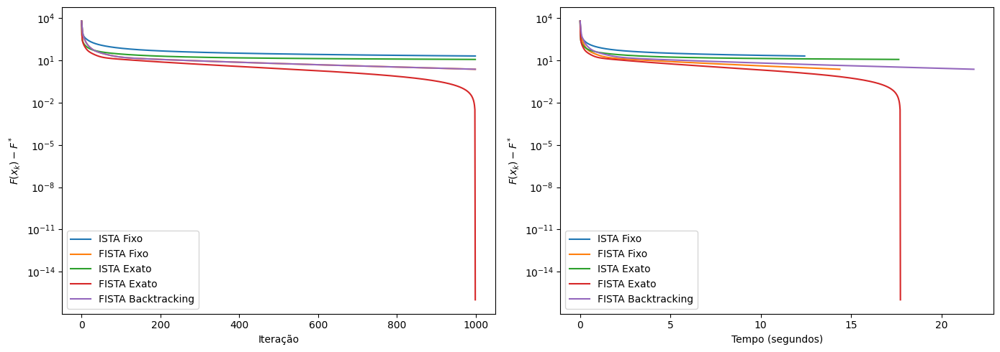

In [11]:
epsilon = 1e-16

names = list( results.keys() )

plt.figure( figsize = ( 14, 5 ) )

plt.subplot( 1, 2, 1 )
for name in names:
    vals = results[ name ][ "function_values" ]
    diff_vals = [ F - F_star + epsilon for F in vals ]
    plt.semilogy( diff_vals, label = name )

plt.xlabel( "Iteração" )
plt.ylabel( "$F(x_k) - F^*$" )
plt.legend()

plt.subplot( 1, 2, 2 )
for name in names:
    vals = np.array( results[ name ][ "function_values" ] )
    diff_vals = vals - F_star + epsilon
    
    total_time = results[ name ][ "avg_time" ]
    times = np.linspace( 0, total_time, len( vals ) )
    
    plt.semilogy( times, diff_vals, label = name )

plt.xlabel( "Tempo (segundos)" )
plt.ylabel( "$F(x_k) - F^*$" )
plt.legend()

plt.tight_layout()
plt.show()

Sem regularização acontece o esperado, os algoritmos convergem e não ficam oscilando (por mais que alguns como o ISTA vão demorar muito mais para convergir)

## Testando com o $\gamma = 0.005$ ótimo

In [8]:
step = 0.2
gamma = 0.005
max_iter = 999
tol = 1.0e-3
x0 = torch.zeros_like( b )

In [11]:
methods = {
    "ISTA Fixo": lambda f, grad_f, prox, x0, gamma, max_iter, tol, **kwargs: 
        Algorithms.ista_fixo( f = f, x0 = x0, grad_f = grad_f, prox = prox, step = step, gamma = gamma, max_iter = max_iter, tol = tol, **kwargs ),
    "FISTA Fixo": lambda f, grad_f, prox, x0, gamma, max_iter, tol, **kwargs: 
        Algorithms.fista_fixo(f = f, x0 = x0, grad_f = grad_f, prox = prox, step = step, gamma = gamma, max_iter = max_iter, tol = tol, **kwargs ),
    "ISTA Exato": lambda f, grad_f, prox, x0, gamma, max_iter, tol, **kwargs: 
        Algorithms.ista_exato( f = f, x0 = x0, grad_f = grad_f, prox = prox, gamma = gamma, max_iter = max_iter, tol = tol, **kwargs ),
    "FISTA Exato": lambda f, grad_f, prox, x0, gamma, max_iter, tol, **kwargs: 
        Algorithms.fista_exato( f = f, x0 = x0, grad_f = grad_f, prox = prox, gamma = gamma, max_iter = max_iter, tol = tol, **kwargs ),
    "FISTA Backtracking": lambda f, grad_f, prox, x0, gamma, max_iter, tol, **kwargs: 
        Algorithms.fista_backtracking(f = f, x0 = x0, grad_f = grad_f, prox = prox, step = step, beta = 0.95, gamma = gamma, max_iter = max_iter, tol = tol, **kwargs )
}

params_wav = {
    'wavelet': 'db5',
    'A': radon
}

F_obj = lambda x: f( x ) + gamma * g( x )

results = compare_methods( 
    methods = methods, 
    f = f, 
    F_obj = F_obj,
    grad_f = grad_f, 
    prox = Algorithms.prox_wavelet, 
    x0 = x0, 
    gamma = gamma, 
    max_iter = max_iter, 
    tol = tol, 
    **params_wav 
)

F_star = min( [ min( res['function_values'] ) for res in results.values() ] )
print( f"Menor valor F_star global: {F_star}" )

Testando ISTA Fixo (5 execuções)...
ISTA Fixo: 12.5161s ± 0.1608s ( 1000 iterações )
Testando FISTA Fixo (5 execuções)...
FISTA Fixo: 12.4541s ± 0.2290s ( 970 iterações )
Testando ISTA Exato (5 execuções)...
ISTA Exato: 15.9992s ± 0.1775s ( 1000 iterações )
Testando FISTA Exato (5 execuções)...
FISTA Exato: 16.0523s ± 0.4554s ( 1000 iterações )
Testando FISTA Backtracking (5 execuções)...
FISTA Backtracking: 22.2260s ± 1.2152s ( 1000 iterações )
Menor valor F_star global: 70.63513946533203


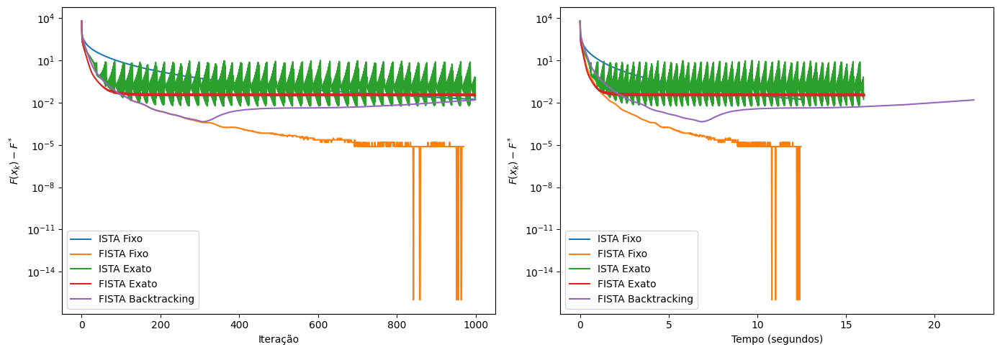

In [12]:
epsilon = 1e-16

names = list( results.keys() )

plt.figure( figsize = ( 14, 5 ) )

plt.subplot( 1, 2, 1 )
for name in names:
    vals = results[ name ][ "function_values" ]
    diff_vals = [ F - F_star + epsilon for F in vals ]
    plt.semilogy( diff_vals, label = name )

plt.xlabel( "Iteração" )
plt.ylabel( "$F(x_k) - F^*$" )
plt.legend()

plt.subplot( 1, 2, 2 )
for name in names:
    vals = np.array( results[ name ][ "function_values" ] )
    diff_vals = vals - F_star + epsilon
    
    total_time = results[ name ][ "avg_time" ]
    times = np.linspace( 0, total_time, len( vals ) )
    
    plt.semilogy( times, diff_vals, label = name )

plt.xlabel( "Tempo (segundos)" )
plt.ylabel( "$F(x_k) - F^*$" )
plt.legend()

plt.tight_layout()
plt.show()

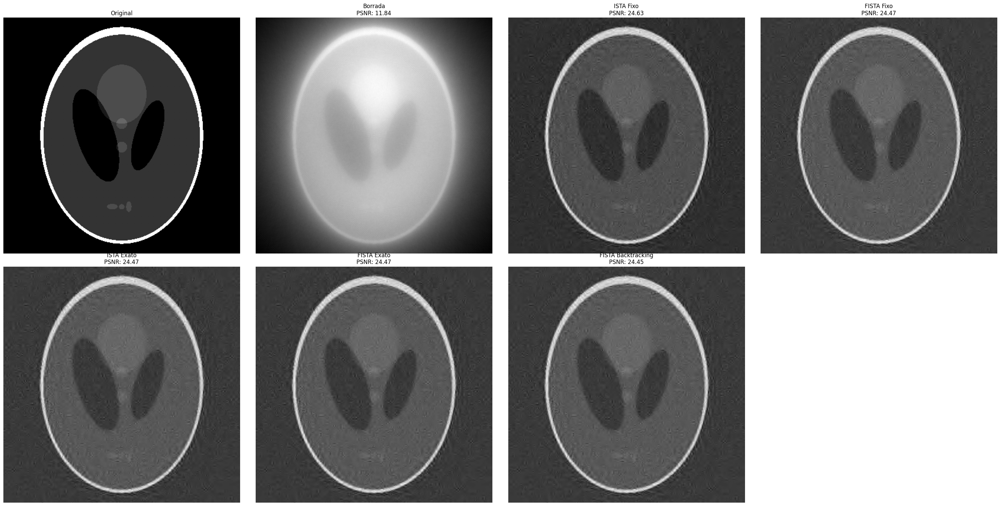

In [13]:
plt.figure( figsize = ( 30, 15 ) )

names = [ "ISTA Fixo", "FISTA Fixo", "ISTA Exato", "FISTA Exato", "FISTA Backtracking" ]

plt.subplot( 2, 4, 1 )
plt.imshow( img.to( 'cpu' ).numpy(), cmap = 'gray' )
plt.title( "Original" )
plt.axis( "off" )

p_b = get_metrics( img.to( 'cpu' ).numpy(), b.to( 'cpu' ).numpy() )
plt.subplot( 2, 4, 2 )
plt.imshow( radon_transpose( b ).to( 'cpu' ).numpy(), cmap = 'gray' )
plt.title( f"Borrada\nPSNR: {p_b:.2f}" )
plt.axis( "off" )

for i, name in enumerate( names, start = 3 ):
    res_img = results[ name ][ "iters" ][ -1 ].to( 'cpu' )
    p = get_metrics( img.to( 'cpu' ).numpy(), res_img.to( 'cpu' ).numpy() )
    
    plt.subplot( 2, 4, i )
    plt.imshow( res_img, cmap = 'gray' )
    plt.title( f"{name}\nPSNR: {p:.2f}" )
    plt.axis( "off" )

plt.tight_layout()
plt.show()

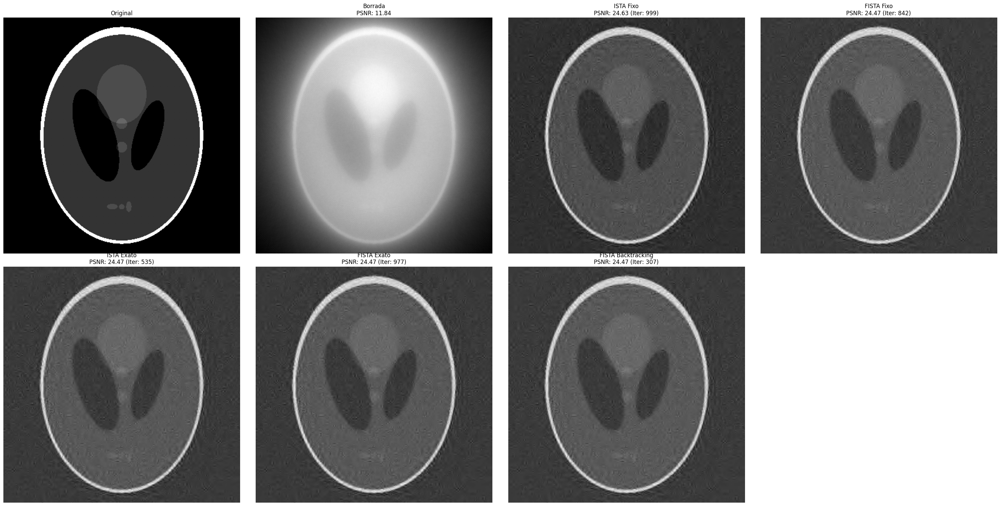

In [14]:
## vendo as melhores iterações de cada método e nao a ultima

plt.figure( figsize = ( 30, 15 ) )

names = [ "ISTA Fixo", "FISTA Fixo", "ISTA Exato", "FISTA Exato", "FISTA Backtracking" ]

plt.subplot( 2, 4, 1 )
plt.imshow( img.cpu().numpy(), cmap = 'gray' )
plt.title( "Original" )
plt.axis( "off" )

p_b = get_metrics( img.cpu().numpy(), b.cpu().numpy() )
plt.subplot( 2, 4, 2 )
plt.imshow( radon_transpose( b ).cpu().numpy(), cmap = 'gray' )
plt.title( f"Borrada\nPSNR: {p_b:.2f}" )
plt.axis( "off" )

for i, name in enumerate( names, start = 3 ):
    # 1. Descobre a iteração que gerou o menor valor da função objetivo
    idx_min = np.argmin( results[ name ][ "function_values" ] )
    
    # 2. Puxa a imagem exatamente dessa iteração ótima
    res_img = results[ name ][ "iters" ][ idx_min ].detach().cpu().numpy()
    
    p = get_metrics( img.cpu().numpy(), res_img )
    
    plt.subplot( 2, 4, i )
    plt.imshow( res_img, cmap = 'gray' )
    
    plt.title( f"{name}\nPSNR: {p:.2f} (Iter: {idx_min})" )
    plt.axis( "off" )

plt.tight_layout()
plt.show()

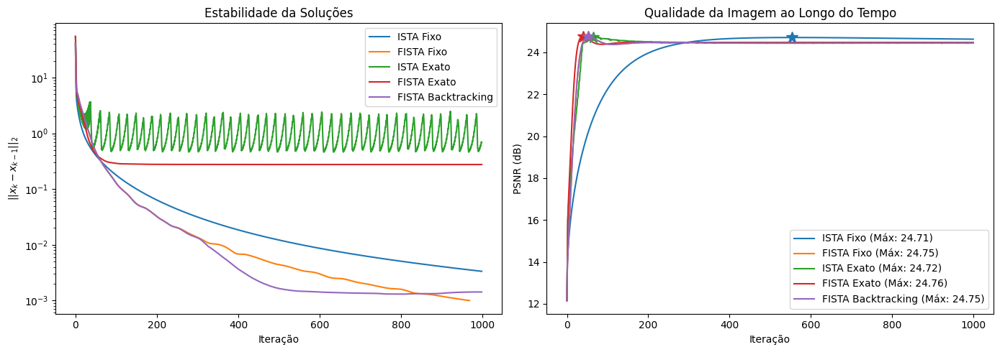

In [15]:
plt.figure( figsize = ( 14, 5 ) )

# 1. Distância entre iterações ||xk - xk-1||
plt.subplot( 1, 2, 1 )
for name in names:
    iters_list = results[ name ][ "iters" ]
    diffs = [ torch.linalg.norm( iters_list[i] - iters_list[i-1] ).item() for i in range( 1, len( iters_list ) ) ]
    
    plt.semilogy( diffs, label = name )

plt.xlabel( "Iteração" )
plt.ylabel( "$||x_k - x_{k-1}||_2$" )
plt.title( "Estabilidade da Soluções" )
plt.legend()

# 2. PSNR vs Iterações
plt.subplot( 1, 2, 2 )
img_np = img.cpu().numpy()

for name in names:
    iters_list = results[ name ][ "iters" ]
    
    psnr_vals = [ get_metrics( img_np, x.detach().cpu().numpy() ) for x in iters_list ] 
    iter_steps = np.arange( 0, len( iters_list ) )
    
    max_psnr = np.max( psnr_vals )
    idx_max = np.argmax( psnr_vals )
    
    line = plt.plot( iter_steps, psnr_vals, label = f"{name} (Máx: {max_psnr:.2f})" )[0]
    
    plt.plot( iter_steps[idx_max], max_psnr, marker = '*', markersize = 12, color = line.get_color() )

plt.xlabel( "Iteração" )
plt.ylabel( "PSNR (dB)" )
plt.title( "Qualidade da Imagem ao Longo do Tempo" )
plt.legend()

plt.tight_layout()
plt.show()

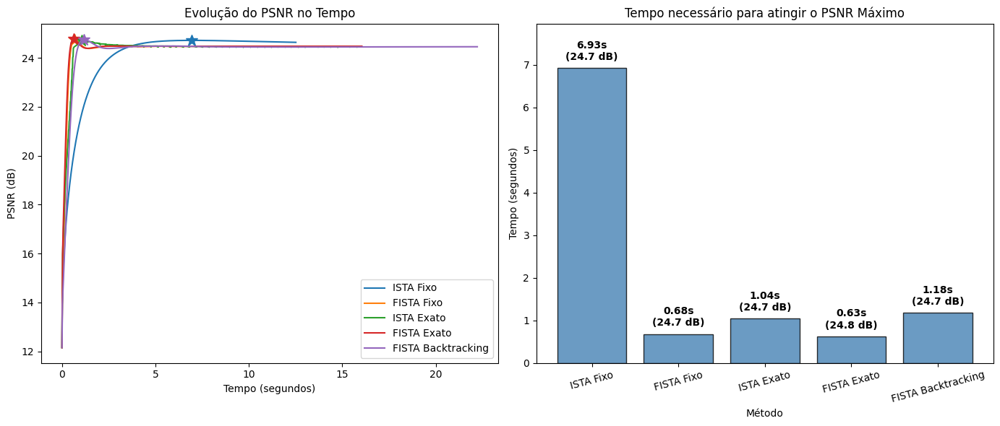

In [16]:
plt.figure( figsize = ( 14, 6 ) )

times_to_max = []
max_psnrs = []
valid_names = []

plt.subplot( 1, 2, 1 )
img_np = img.cpu().numpy()

for name in names:
    iters_list = results[ name ][ "iters" ]
    total_time = results[ name ][ "avg_time" ]
    
    psnr_vals = [ get_metrics( img_np, x.detach().cpu().numpy() ) for x in iters_list ] 
    
    times = np.linspace( 0, total_time, len( iters_list ) )
    
    max_psnr = np.max( psnr_vals )
    idx_max = np.argmax( psnr_vals )
    time_to_max = times[ idx_max ]
    
    times_to_max.append( time_to_max )
    max_psnrs.append( max_psnr )
    valid_names.append( name )
    
    line = plt.plot( times, psnr_vals, label = f"{name}" )[0]
    
    plt.plot( time_to_max, max_psnr, marker = '*', markersize = 12, color = line.get_color() )

plt.xlabel( "Tempo (segundos)" )
plt.ylabel( "PSNR (dB)" )
plt.title( "Evolução do PSNR no Tempo" )
plt.legend()

plt.subplot( 1, 2, 2 )

bars = plt.bar( valid_names, times_to_max, color = 'steelblue', edgecolor = 'black', alpha = 0.8 )

for bar, psnr_val, t_max in zip( bars, max_psnrs, times_to_max ):
    yval = bar.get_height()
    plt.text( bar.get_x() + bar.get_width()/2, yval + ( 0.02 * max(times_to_max) ), 
              f"{t_max:.2f}s\n({psnr_val:.1f} dB)", 
              ha = 'center', va = 'bottom', fontsize = 10, fontweight = 'bold' )

plt.xlabel( "Método" )
plt.ylabel( "Tempo (segundos)" )
plt.title( "Tempo necessário para atingir o PSNR Máximo" )
plt.xticks( rotation = 15 )

plt.ylim( 0, max( times_to_max ) * 1.15 )

plt.tight_layout()
plt.show()

# FISTA Backtracking com ISTA e FISTA Passo Exato

## E se usarmos um parâmetro de regularização maior?


In [9]:
step = 0.2
gamma = 0.01
max_iter = 999
tol = 1.0e-3
x0 = torch.zeros_like( b )

In [10]:
methods = {
    "FISTA Fixo": lambda f, grad_f, prox, x0, gamma, max_iter, tol, **kwargs: 
        Algorithms.fista_fixo(f = f, x0 = x0, grad_f = grad_f, prox = prox, step = step, gamma = gamma, max_iter = max_iter, tol = tol, **kwargs ),
    "ISTA Exato": lambda f, grad_f, prox, x0, gamma, max_iter, tol, **kwargs: 
        Algorithms.ista_exato( f = f, x0 = x0, grad_f = grad_f, prox = prox, gamma = gamma, max_iter = max_iter, tol = tol, **kwargs ),
    "FISTA Exato": lambda f, grad_f, prox, x0, gamma, max_iter, tol, **kwargs: 
        Algorithms.fista_exato( f = f, x0 = x0, grad_f = grad_f, prox = prox, gamma = gamma, max_iter = max_iter, tol = tol, **kwargs ),
}

params_wav = {
    'wavelet': 'db5',
    'A': radon
}

F_obj = lambda x: f( x ) + gamma * g( x )

results = compare_methods( 
    methods = methods, 
    f = f, 
    F_obj = F_obj,
    grad_f = grad_f, 
    prox = Algorithms.prox_wavelet, 
    x0 = x0, 
    gamma = gamma, 
    max_iter = max_iter, 
    tol = tol, 
    **params_wav 
)

F_star = min( [ min( res['function_values'] ) for res in results.values() ] )
print( f"Menor valor F_star global: {F_star}" )

Testando FISTA Fixo (5 execuções)...
FISTA Fixo: 12.6597s ± 0.2256s ( 1000 iterações )
Testando ISTA Exato (5 execuções)...
ISTA Exato: 17.0375s ± 1.0300s ( 1000 iterações )
Testando FISTA Exato (5 execuções)...
FISTA Exato: 17.9045s ± 1.1315s ( 1000 iterações )
Menor valor F_star global: 82.94993591308594


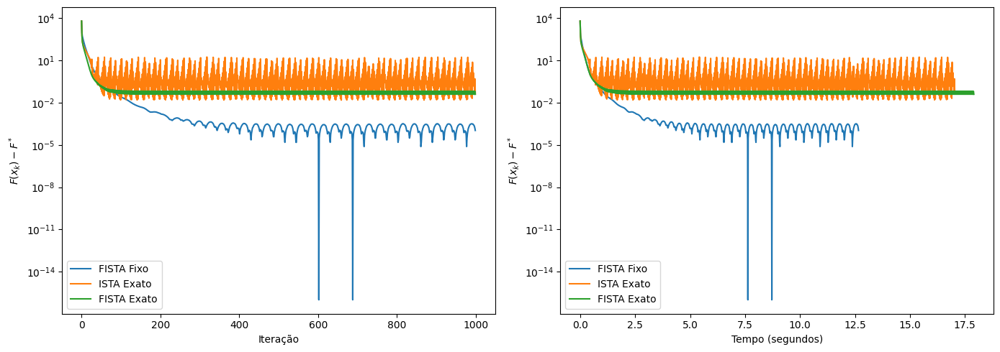

In [11]:
epsilon = 1e-16

names = list( results.keys() )

plt.figure( figsize = ( 14, 5 ) )

plt.subplot( 1, 2, 1 )
for name in names:
    vals = results[ name ][ "function_values" ]
    diff_vals = [ F - F_star + epsilon for F in vals ]
    plt.semilogy( diff_vals, label = name )

plt.xlabel( "Iteração" )
plt.ylabel( "$F(x_k) - F^*$" )
plt.legend()
    
plt.subplot( 1, 2, 2 )
for name in names:
    vals = np.array( results[ name ][ "function_values" ] )
    diff_vals = vals - F_star + epsilon
    
    total_time = results[ name ][ "avg_time" ]
    times = np.linspace( 0, total_time, len( vals ) )
    
    plt.semilogy( times, diff_vals, label = name )

plt.xlabel( "Tempo (segundos)" )
plt.ylabel( "$F(x_k) - F^*$" )
plt.legend()

plt.tight_layout()
plt.show()

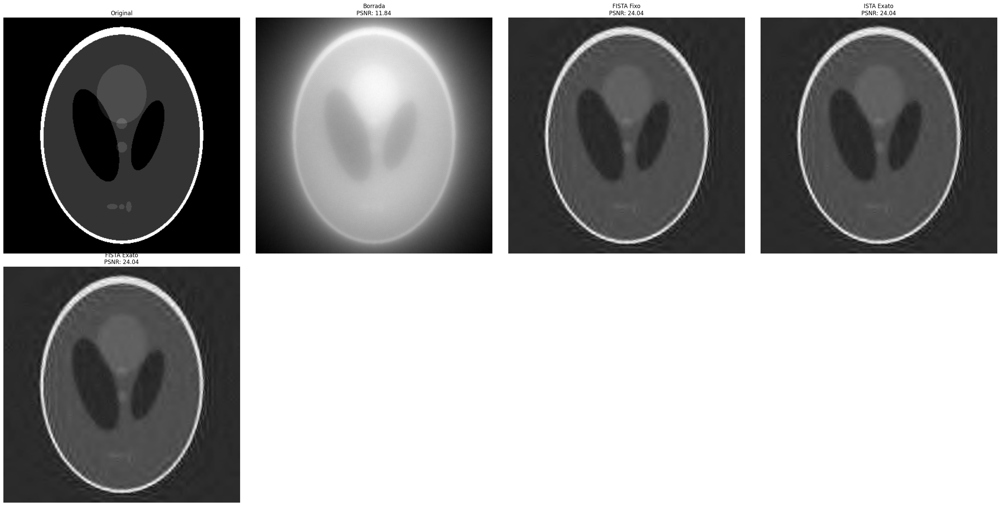

In [12]:
plt.figure( figsize = ( 30, 15 ) )

names = [ "FISTA Fixo", "ISTA Exato", "FISTA Exato" ]

plt.subplot( 2, 4, 1 )
plt.imshow( img.to( 'cpu' ).numpy(), cmap = 'gray' )
plt.title( "Original" )
plt.axis( "off" )

p_b = get_metrics( img.to( 'cpu' ).numpy(), b.to( 'cpu' ).numpy() )
plt.subplot( 2, 4, 2 )
plt.imshow( radon_transpose( b ).to( 'cpu' ).numpy(), cmap = 'gray' )
plt.title( f"Borrada\nPSNR: {p_b:.2f}" )
plt.axis( "off" )

for i, name in enumerate( names, start = 3 ):
    res_img = results[ name ][ "iters" ][ -1 ].to( 'cpu' )
    p = get_metrics( img.to( 'cpu' ).numpy(), res_img.to( 'cpu' ).numpy() )
    
    plt.subplot( 2, 4, i )
    plt.imshow( res_img, cmap = 'gray' )
    plt.title( f"{name}\nPSNR: {p:.2f}" )
    plt.axis( "off" )

plt.tight_layout()
plt.show()

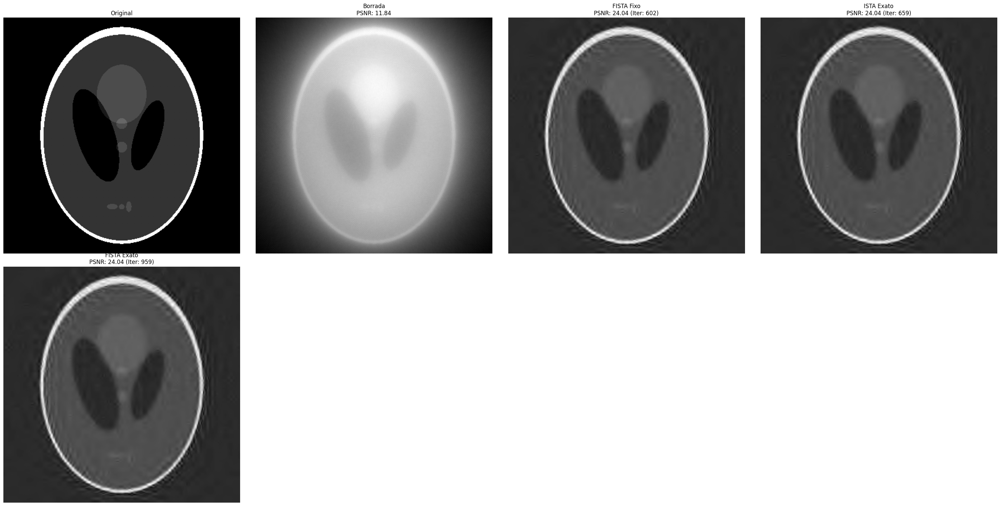

In [13]:
## vendo as melhores iterações de cada método e nao a ultima

plt.figure( figsize = ( 30, 15 ) )

plt.subplot( 2, 4, 1 )
plt.imshow( img.cpu().numpy(), cmap = 'gray' )
plt.title( "Original" )
plt.axis( "off" )

p_b = get_metrics( img.cpu().numpy(), b.cpu().numpy() )
plt.subplot( 2, 4, 2 )
plt.imshow( radon_transpose( b ).cpu().numpy(), cmap = 'gray' )
plt.title( f"Borrada\nPSNR: {p_b:.2f}" )
plt.axis( "off" )

for i, name in enumerate( names, start = 3 ):
    # 1. Descobre a iteração que gerou o menor valor da função objetivo
    idx_min = np.argmin( results[ name ][ "function_values" ] )
    
    # 2. Puxa a imagem exatamente dessa iteração ótima
    res_img = results[ name ][ "iters" ][ idx_min ].detach().cpu().numpy()
    
    p = get_metrics( img.cpu().numpy(), res_img )
    
    plt.subplot( 2, 4, i )
    plt.imshow( res_img, cmap = 'gray' )
    
    plt.title( f"{name}\nPSNR: {p:.2f} (Iter: {idx_min})" )
    plt.axis( "off" )

plt.tight_layout()
plt.show()

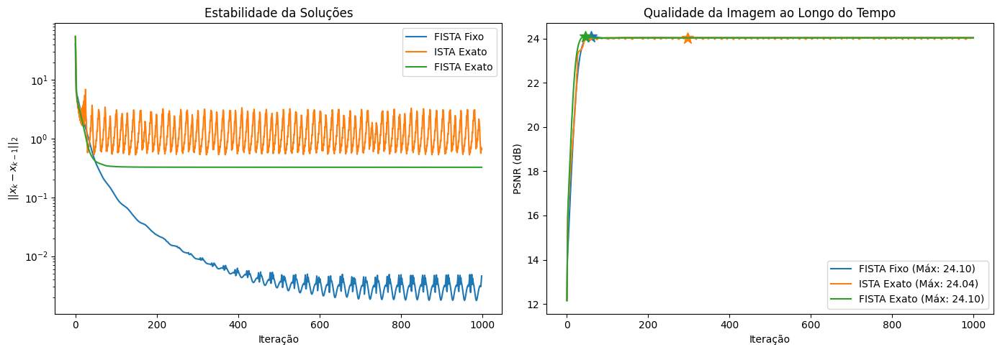

In [14]:
plt.figure( figsize = ( 14, 5 ) )

# 1. Distância entre iterações ||xk - xk-1||
plt.subplot( 1, 2, 1 )
for name in names:
    iters_list = results[ name ][ "iters" ]
    diffs = [ torch.linalg.norm( iters_list[i] - iters_list[i-1] ).item() for i in range( 1, len( iters_list ) ) ]
    
    plt.semilogy( diffs, label = name )

plt.xlabel( "Iteração" )
plt.ylabel( "$||x_k - x_{k-1}||_2$" )
plt.title( "Estabilidade da Soluções" )
plt.legend()

# 2. PSNR vs Iterações
plt.subplot( 1, 2, 2 )
img_np = img.cpu().numpy()

for name in names:
    iters_list = results[ name ][ "iters" ]
    
    psnr_vals = [ get_metrics( img_np, x.detach().cpu().numpy() ) for x in iters_list ] 
    iter_steps = np.arange( 0, len( iters_list ) )
    
    max_psnr = np.max( psnr_vals )
    idx_max = np.argmax( psnr_vals )
    
    line = plt.plot( iter_steps, psnr_vals, label = f"{name} (Máx: {max_psnr:.2f})" )[0]
    
    plt.plot( iter_steps[idx_max], max_psnr, marker = '*', markersize = 12, color = line.get_color() )

plt.xlabel( "Iteração" )
plt.ylabel( "PSNR (dB)" )
plt.title( "Qualidade da Imagem ao Longo do Tempo" )
plt.legend()

plt.tight_layout()
plt.show()

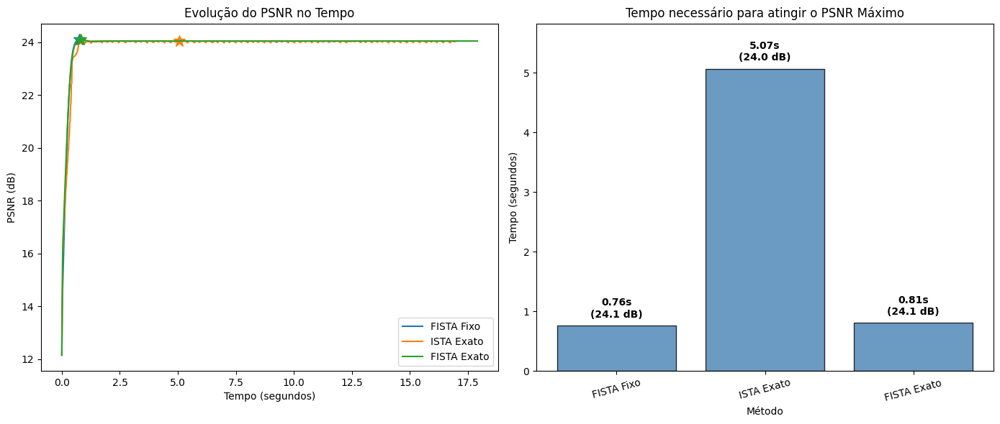

In [15]:
plt.figure( figsize = ( 14, 6 ) )

times_to_max = []
max_psnrs = []
valid_names = []

plt.subplot( 1, 2, 1 )
img_np = img.cpu().numpy()

for name in names:
    iters_list = results[ name ][ "iters" ]
    total_time = results[ name ][ "avg_time" ]
    
    psnr_vals = [ get_metrics( img_np, x.detach().cpu().numpy() ) for x in iters_list ] 
    
    times = np.linspace( 0, total_time, len( iters_list ) )
    
    max_psnr = np.max( psnr_vals )
    idx_max = np.argmax( psnr_vals )
    time_to_max = times[ idx_max ]
    
    times_to_max.append( time_to_max )
    max_psnrs.append( max_psnr )
    valid_names.append( name )
    
    line = plt.plot( times, psnr_vals, label = f"{name}" )[0]
    
    plt.plot( time_to_max, max_psnr, marker = '*', markersize = 12, color = line.get_color() )

plt.xlabel( "Tempo (segundos)" )
plt.ylabel( "PSNR (dB)" )
plt.title( "Evolução do PSNR no Tempo" )
plt.legend()

plt.subplot( 1, 2, 2 )

bars = plt.bar( valid_names, times_to_max, color = 'steelblue', edgecolor = 'black', alpha = 0.8 )

for bar, psnr_val, t_max in zip( bars, max_psnrs, times_to_max ):
    yval = bar.get_height()
    plt.text( bar.get_x() + bar.get_width()/2, yval + ( 0.02 * max(times_to_max) ), 
              f"{t_max:.2f}s\n({psnr_val:.1f} dB)", 
              ha = 'center', va = 'bottom', fontsize = 10, fontweight = 'bold' )

plt.xlabel( "Método" )
plt.ylabel( "Tempo (segundos)" )
plt.title( "Tempo necessário para atingir o PSNR Máximo" )
plt.xticks( rotation = 15 )

plt.ylim( 0, max( times_to_max ) * 1.15 )

plt.tight_layout()
plt.show()

## E se a tolerância for menor?


In [9]:
step = 0.2
gamma = 0.01
max_iter = 999
tol = 1.0e-2
x0 = torch.zeros_like( b )

In [10]:
methods = {
    "FISTA Fixo": lambda f, grad_f, prox, x0, gamma, max_iter, tol, **kwargs: 
        Algorithms.fista_fixo(f = f, x0 = x0, grad_f = grad_f, prox = prox, step = step, gamma = gamma, max_iter = max_iter, tol = tol, **kwargs ),
    "ISTA Exato": lambda f, grad_f, prox, x0, gamma, max_iter, tol, **kwargs: 
        Algorithms.ista_exato( f = f, x0 = x0, grad_f = grad_f, prox = prox, gamma = gamma, max_iter = max_iter, tol = tol, **kwargs ),
    "FISTA Exato": lambda f, grad_f, prox, x0, gamma, max_iter, tol, **kwargs: 
        Algorithms.fista_exato( f = f, x0 = x0, grad_f = grad_f, prox = prox, gamma = gamma, max_iter = max_iter, tol = tol, **kwargs ),
}

params_wav = {
    'wavelet': 'db5',
    'A': radon
}

F_obj = lambda x: f( x ) + gamma * g( x )

results = compare_methods( 
    methods = methods, 
    f = f, 
    F_obj = F_obj,
    grad_f = grad_f, 
    prox = Algorithms.prox_wavelet, 
    x0 = x0, 
    gamma = gamma, 
    max_iter = max_iter, 
    tol = tol, 
    **params_wav 
)

F_star = min( [ min( res['function_values'] ) for res in results.values() ] )
print( f"Menor valor F_star global: {F_star}" )

Testando FISTA Fixo (5 execuções)...
FISTA Fixo: 4.2063s ± 0.1432s ( 291 iterações )
Testando ISTA Exato (5 execuções)...
ISTA Exato: 16.2080s ± 0.4682s ( 1000 iterações )
Testando FISTA Exato (5 execuções)...
FISTA Exato: 18.0658s ± 1.6362s ( 1000 iterações )
Menor valor F_star global: 82.95016479492188


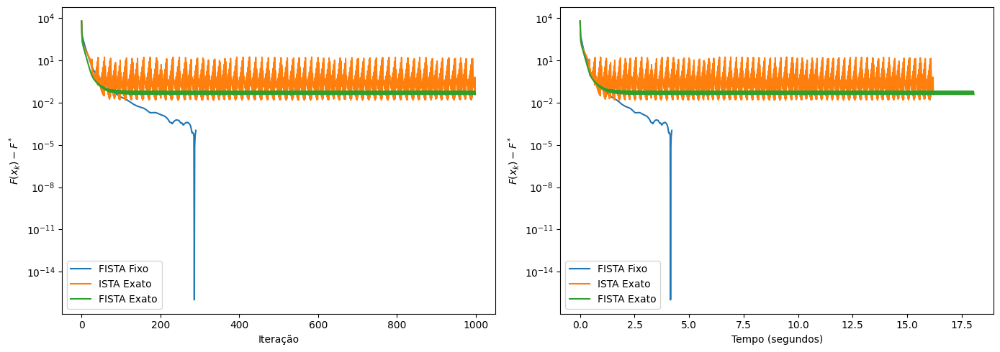

In [11]:
epsilon = 1e-16

names = list( results.keys() )

plt.figure( figsize = ( 14, 5 ) )

plt.subplot( 1, 2, 1 )
for name in names:
    vals = results[ name ][ "function_values" ]
    diff_vals = [ F - F_star + epsilon for F in vals ]
    plt.semilogy( diff_vals, label = name )

plt.xlabel( "Iteração" )
plt.ylabel( "$F(x_k) - F^*$" )
plt.legend()

plt.subplot( 1, 2, 2 )
for name in names:
    vals = np.array( results[ name ][ "function_values" ] )
    diff_vals = vals - F_star + epsilon
    
    total_time = results[ name ][ "avg_time" ]
    times = np.linspace( 0, total_time, len( vals ) )
    
    plt.semilogy( times, diff_vals, label = name )

plt.xlabel( "Tempo (segundos)" )
plt.ylabel( "$F(x_k) - F^*$" )
plt.legend()

plt.tight_layout()
plt.show()

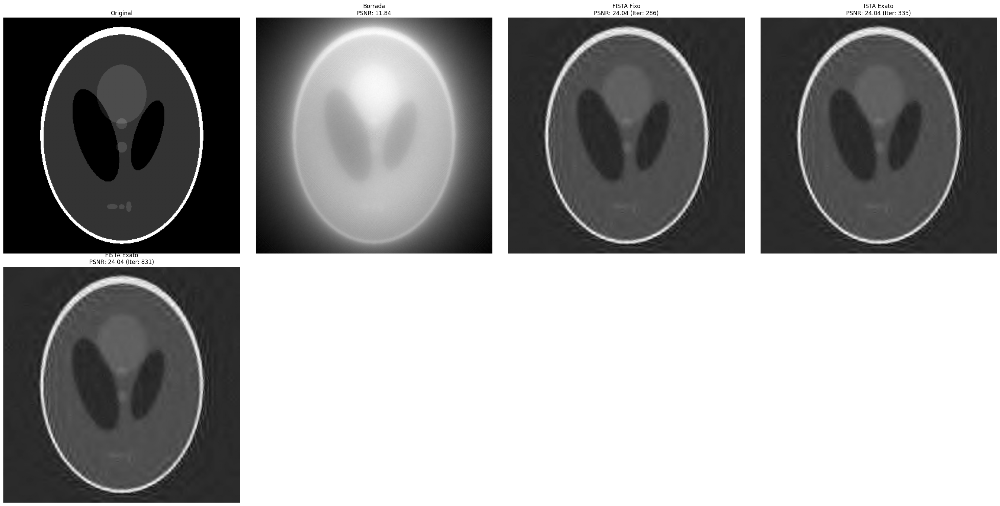

In [12]:
## vendo as melhores iterações de cada método e nao a ultima

plt.figure( figsize = ( 30, 15 ) )

plt.subplot( 2, 4, 1 )
plt.imshow( img.cpu().numpy(), cmap = 'gray' )
plt.title( "Original" )
plt.axis( "off" )

p_b = get_metrics( img.cpu().numpy(), b.cpu().numpy() )
plt.subplot( 2, 4, 2 )
plt.imshow( radon_transpose( b ).cpu().numpy(), cmap = 'gray' )
plt.title( f"Borrada\nPSNR: {p_b:.2f}" )
plt.axis( "off" )

for i, name in enumerate( names, start = 3 ):
    # 1. Descobre a iteração que gerou o menor valor da função objetivo
    idx_min = np.argmin( results[ name ][ "function_values" ] )
    
    # 2. Puxa a imagem exatamente dessa iteração ótima
    res_img = results[ name ][ "iters" ][ idx_min ].detach().cpu().numpy()
    
    p = get_metrics( img.cpu().numpy(), res_img )
    
    plt.subplot( 2, 4, i )
    plt.imshow( res_img, cmap = 'gray' )
    
    plt.title( f"{name}\nPSNR: {p:.2f} (Iter: {idx_min})" )
    plt.axis( "off" )

plt.tight_layout()
plt.show()

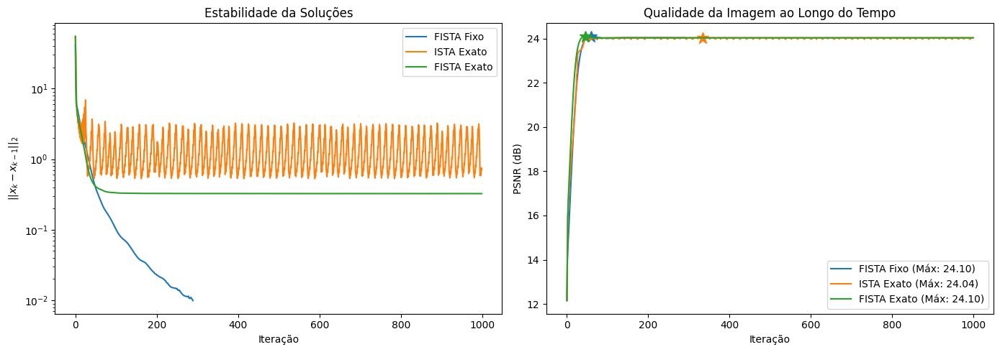

In [13]:
plt.figure( figsize = ( 14, 5 ) )

# 1. Distância entre iterações ||xk - xk-1||
plt.subplot( 1, 2, 1 )
for name in names:
    iters_list = results[ name ][ "iters" ]
    diffs = [ torch.linalg.norm( iters_list[i] - iters_list[i-1] ).item() for i in range( 1, len( iters_list ) ) ]
    
    plt.semilogy( diffs, label = name )

plt.xlabel( "Iteração" )
plt.ylabel( "$||x_k - x_{k-1}||_2$" )
plt.title( "Estabilidade da Soluções" )
plt.legend()

# 2. PSNR vs Iterações
plt.subplot( 1, 2, 2 )
img_np = img.cpu().numpy()

for name in names:
    iters_list = results[ name ][ "iters" ]
    
    psnr_vals = [ get_metrics( img_np, x.detach().cpu().numpy() ) for x in iters_list ] 
    iter_steps = np.arange( 0, len( iters_list ) )
    
    max_psnr = np.max( psnr_vals )
    idx_max = np.argmax( psnr_vals )
    
    line = plt.plot( iter_steps, psnr_vals, label = f"{name} (Máx: {max_psnr:.2f})" )[0]
    
    plt.plot( iter_steps[idx_max], max_psnr, marker = '*', markersize = 12, color = line.get_color() )

plt.xlabel( "Iteração" )
plt.ylabel( "PSNR (dB)" )
plt.title( "Qualidade da Imagem ao Longo do Tempo" )
plt.legend()

plt.tight_layout()
plt.show()

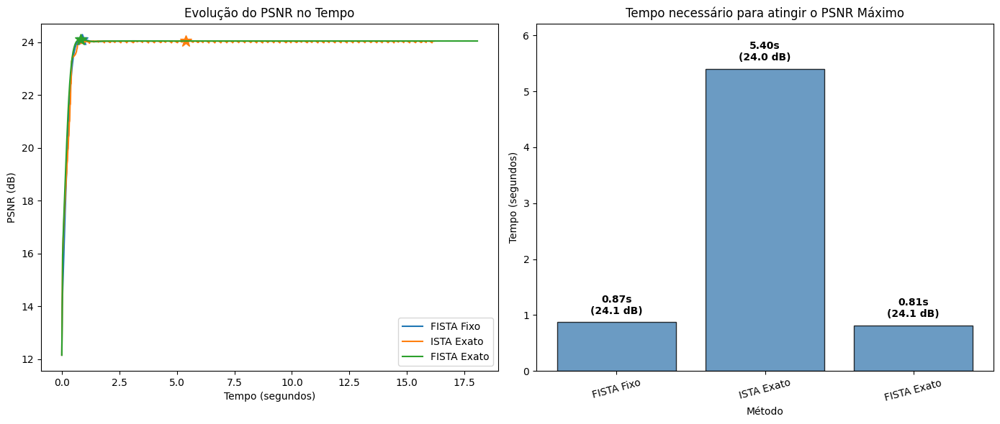

In [14]:
plt.figure( figsize = ( 14, 6 ) )

times_to_max = []
max_psnrs = []
valid_names = []

plt.subplot( 1, 2, 1 )
img_np = img.cpu().numpy()

for name in names:
    iters_list = results[ name ][ "iters" ]
    total_time = results[ name ][ "avg_time" ]
    
    psnr_vals = [ get_metrics( img_np, x.detach().cpu().numpy() ) for x in iters_list ] 
    
    times = np.linspace( 0, total_time, len( iters_list ) )
    
    max_psnr = np.max( psnr_vals )
    idx_max = np.argmax( psnr_vals )
    time_to_max = times[ idx_max ]
    
    times_to_max.append( time_to_max )
    max_psnrs.append( max_psnr )
    valid_names.append( name )
    
    line = plt.plot( times, psnr_vals, label = f"{name}" )[0]
    
    plt.plot( time_to_max, max_psnr, marker = '*', markersize = 12, color = line.get_color() )

plt.xlabel( "Tempo (segundos)" )
plt.ylabel( "PSNR (dB)" )
plt.title( "Evolução do PSNR no Tempo" )
plt.legend()

plt.subplot( 1, 2, 2 )

bars = plt.bar( valid_names, times_to_max, color = 'steelblue', edgecolor = 'black', alpha = 0.8 )

for bar, psnr_val, t_max in zip( bars, max_psnrs, times_to_max ):
    yval = bar.get_height()
    plt.text( bar.get_x() + bar.get_width()/2, yval + ( 0.02 * max(times_to_max) ), 
              f"{t_max:.2f}s\n({psnr_val:.1f} dB)", 
              ha = 'center', va = 'bottom', fontsize = 10, fontweight = 'bold' )

plt.xlabel( "Método" )
plt.ylabel( "Tempo (segundos)" )
plt.title( "Tempo necessário para atingir o PSNR Máximo" )
plt.xticks( rotation = 15 )

plt.ylim( 0, max( times_to_max ) * 1.15 )

plt.tight_layout()
plt.show()

## E se o chute inicial for $A^Tb$?

In [9]:
step = 0.2
gamma = 0.01
max_iter = 999
tol = 1.0e-2
x0 = radon_transpose( b )

In [10]:
methods = {
    "FISTA Fixo": lambda f, grad_f, prox, x0, gamma, max_iter, tol, **kwargs: 
        Algorithms.fista_fixo(f = f, x0 = x0, grad_f = grad_f, prox = prox, step = step, gamma = gamma, max_iter = max_iter, tol = tol, **kwargs ),
    "ISTA Exato": lambda f, grad_f, prox, x0, gamma, max_iter, tol, **kwargs: 
        Algorithms.ista_exato( f = f, x0 = x0, grad_f = grad_f, prox = prox, gamma = gamma, max_iter = max_iter, tol = tol, **kwargs ),
    "FISTA Exato": lambda f, grad_f, prox, x0, gamma, max_iter, tol, **kwargs: 
        Algorithms.fista_exato( f = f, x0 = x0, grad_f = grad_f, prox = prox, gamma = gamma, max_iter = max_iter, tol = tol, **kwargs ),
}

params_wav = {
    'wavelet': 'db5',
    'A': radon
}

F_obj = lambda x: f( x ) + gamma * g( x )

results = compare_methods( 
    methods = methods, 
    f = f, 
    F_obj = F_obj,
    grad_f = grad_f, 
    prox = Algorithms.prox_wavelet, 
    x0 = x0, 
    gamma = gamma, 
    max_iter = max_iter, 
    tol = tol, 
    **params_wav 
)

F_star = min( [ min( res['function_values'] ) for res in results.values() ] )
print( f"Menor valor F_star global: {F_star}" )

Testando FISTA Fixo (5 execuções)...
FISTA Fixo: 4.0878s ± 0.2538s ( 288 iterações )
Testando ISTA Exato (5 execuções)...
ISTA Exato: 16.7175s ± 0.7945s ( 1000 iterações )
Testando FISTA Exato (5 execuções)...
FISTA Exato: 16.9710s ± 0.5924s ( 1000 iterações )
Menor valor F_star global: 82.95014953613281


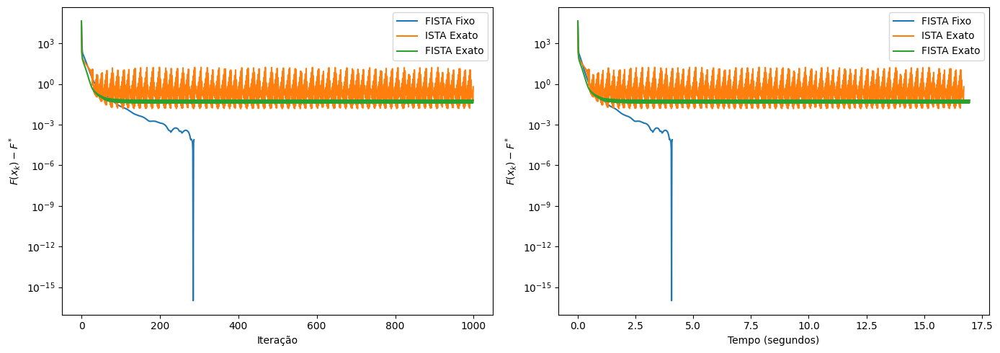

In [11]:
epsilon = 1e-16

names = list( results.keys() )

plt.figure( figsize = ( 14, 5 ) )

plt.subplot( 1, 2, 1 )
for name in names:
    vals = results[ name ][ "function_values" ]
    diff_vals = [ F - F_star + epsilon for F in vals ]
    plt.semilogy( diff_vals, label = name )

plt.xlabel( "Iteração" )
plt.ylabel( "$F(x_k) - F^*$" )
plt.legend()

plt.subplot( 1, 2, 2 )
for name in names:
    vals = np.array( results[ name ][ "function_values" ] )
    diff_vals = vals - F_star + epsilon
    
    total_time = results[ name ][ "avg_time" ]
    times = np.linspace( 0, total_time, len( vals ) )
    
    plt.semilogy( times, diff_vals, label = name )

plt.xlabel( "Tempo (segundos)" )
plt.ylabel( "$F(x_k) - F^*$" )
plt.legend()

plt.tight_layout()
plt.show()

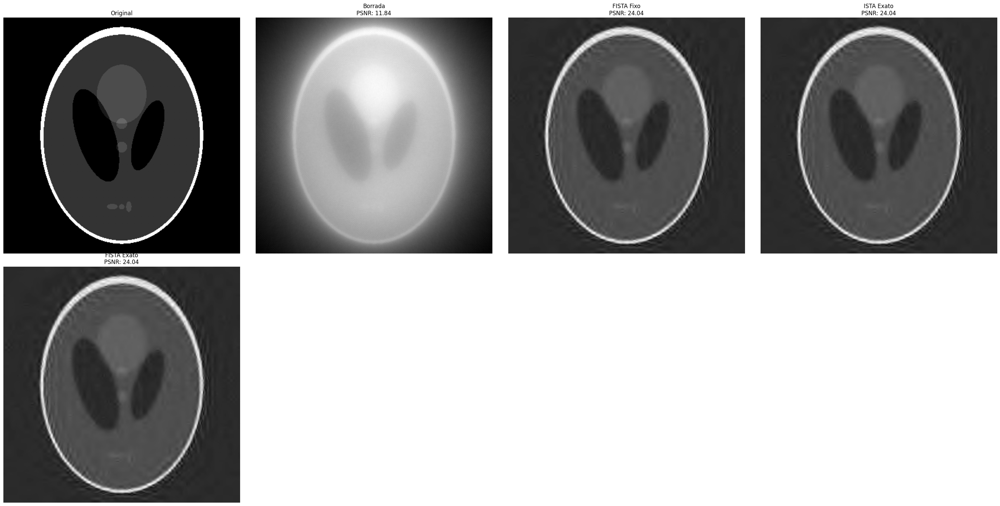

In [12]:
plt.figure( figsize = ( 30, 15 ) )

names = [ "FISTA Fixo", "ISTA Exato", "FISTA Exato" ]

plt.subplot( 2, 4, 1 )
plt.imshow( img.to( 'cpu' ).numpy(), cmap = 'gray' )
plt.title( "Original" )
plt.axis( "off" )

p_b = get_metrics( img.to( 'cpu' ).numpy(), b.to( 'cpu' ).numpy() )
plt.subplot( 2, 4, 2 )
plt.imshow( radon_transpose( b ).to( 'cpu' ).numpy(), cmap = 'gray' )
plt.title( f"Borrada\nPSNR: {p_b:.2f}" )
plt.axis( "off" )

for i, name in enumerate( names, start = 3 ):
    res_img = results[ name ][ "iters" ][ -1 ].to( 'cpu' )
    p = get_metrics( img.to( 'cpu' ).numpy(), res_img.to( 'cpu' ).numpy() )
    
    plt.subplot( 2, 4, i )
    plt.imshow( res_img, cmap = 'gray' )
    plt.title( f"{name}\nPSNR: {p:.2f}" )
    plt.axis( "off" )

plt.tight_layout()
plt.show()

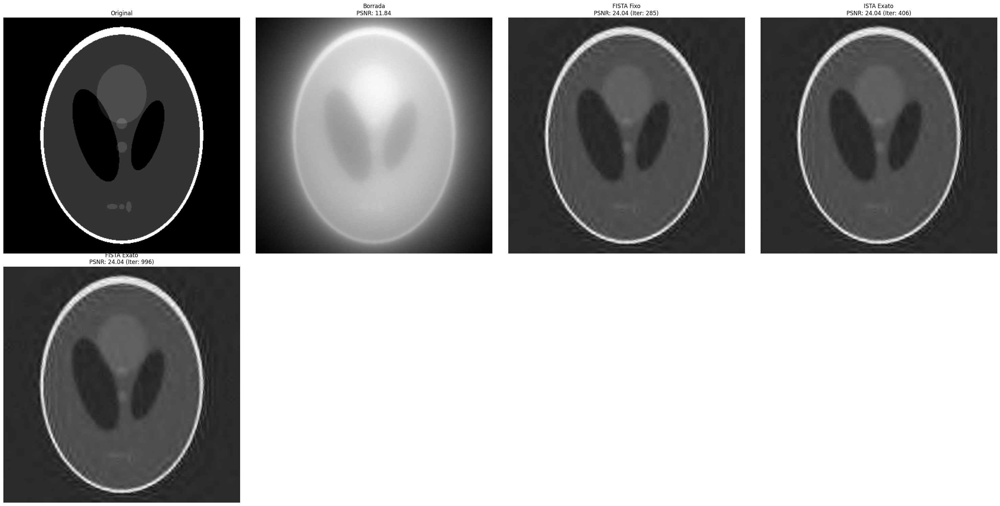

In [13]:
## vendo as melhores iterações de cada método e nao a ultima

plt.figure( figsize = ( 30, 15 ) )

plt.subplot( 2, 4, 1 )
plt.imshow( img.cpu().numpy(), cmap = 'gray' )
plt.title( "Original" )
plt.axis( "off" )

p_b = get_metrics( img.cpu().numpy(), b.cpu().numpy() )
plt.subplot( 2, 4, 2 )
plt.imshow( radon_transpose( b ).cpu().numpy(), cmap = 'gray' )
plt.title( f"Borrada\nPSNR: {p_b:.2f}" )
plt.axis( "off" )

for i, name in enumerate( names, start = 3 ):
    # 1. Descobre a iteração que gerou o menor valor da função objetivo
    idx_min = np.argmin( results[ name ][ "function_values" ] )
    
    # 2. Puxa a imagem exatamente dessa iteração ótima
    res_img = results[ name ][ "iters" ][ idx_min ].detach().cpu().numpy()
    
    p = get_metrics( img.cpu().numpy(), res_img )
    
    plt.subplot( 2, 4, i )
    plt.imshow( res_img, cmap = 'gray' )
    
    plt.title( f"{name}\nPSNR: {p:.2f} (Iter: {idx_min})" )
    plt.axis( "off" )

plt.tight_layout()
plt.show()

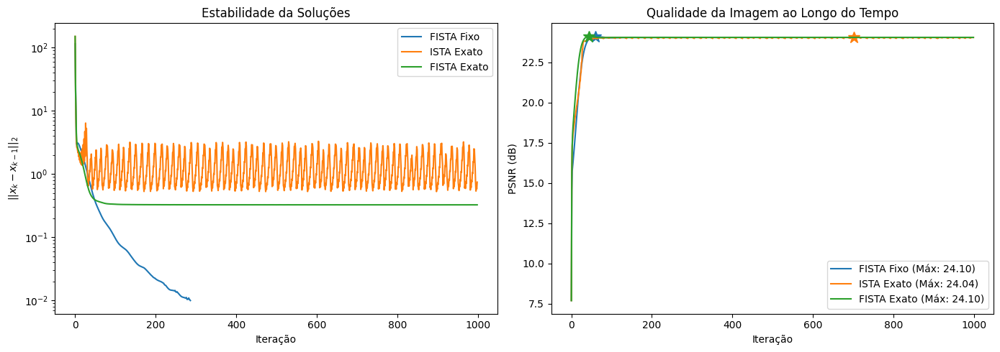

In [14]:
plt.figure( figsize = ( 14, 5 ) )

# 1. Distância entre iterações ||xk - xk-1||
plt.subplot( 1, 2, 1 )
for name in names:
    iters_list = results[ name ][ "iters" ]
    diffs = [ torch.linalg.norm( iters_list[i] - iters_list[i-1] ).item() for i in range( 1, len( iters_list ) ) ]
    
    plt.semilogy( diffs, label = name )

plt.xlabel( "Iteração" )
plt.ylabel( "$||x_k - x_{k-1}||_2$" )
plt.title( "Estabilidade da Soluções" )
plt.legend()

# 2. PSNR vs Iterações
plt.subplot( 1, 2, 2 )
img_np = img.cpu().numpy()

for name in names:
    iters_list = results[ name ][ "iters" ]
    
    psnr_vals = [ get_metrics( img_np, x.detach().cpu().numpy() ) for x in iters_list ] 
    iter_steps = np.arange( 0, len( iters_list ) )
    
    max_psnr = np.max( psnr_vals )
    idx_max = np.argmax( psnr_vals )
    
    line = plt.plot( iter_steps, psnr_vals, label = f"{name} (Máx: {max_psnr:.2f})" )[0]
    
    plt.plot( iter_steps[idx_max], max_psnr, marker = '*', markersize = 12, color = line.get_color() )

plt.xlabel( "Iteração" )
plt.ylabel( "PSNR (dB)" )
plt.title( "Qualidade da Imagem ao Longo do Tempo" )
plt.legend()

plt.tight_layout()
plt.show()

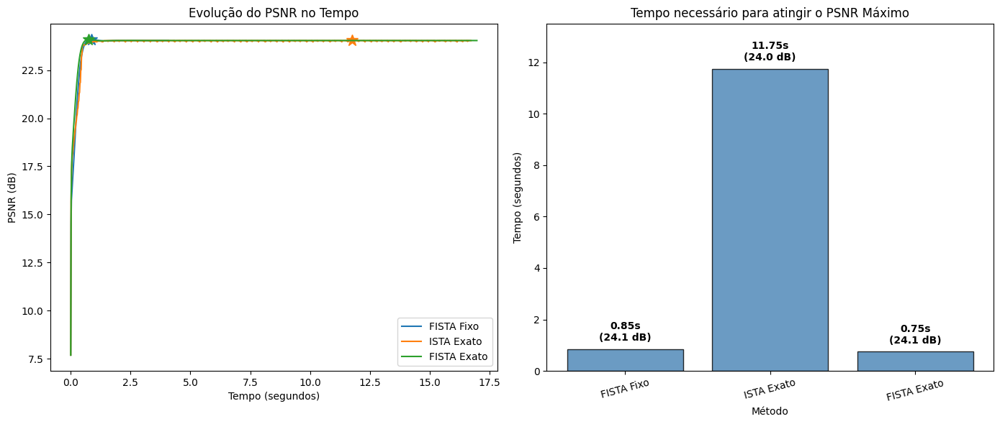

In [15]:
plt.figure( figsize = ( 14, 6 ) )

times_to_max = []
max_psnrs = []
valid_names = []

plt.subplot( 1, 2, 1 )
img_np = img.cpu().numpy()

for name in names:
    iters_list = results[ name ][ "iters" ]
    total_time = results[ name ][ "avg_time" ]
    
    psnr_vals = [ get_metrics( img_np, x.detach().cpu().numpy() ) for x in iters_list ] 
    
    times = np.linspace( 0, total_time, len( iters_list ) )
    
    max_psnr = np.max( psnr_vals )
    idx_max = np.argmax( psnr_vals )
    time_to_max = times[ idx_max ]
    
    times_to_max.append( time_to_max )
    max_psnrs.append( max_psnr )
    valid_names.append( name )
    
    line = plt.plot( times, psnr_vals, label = f"{name}" )[0]
    
    plt.plot( time_to_max, max_psnr, marker = '*', markersize = 12, color = line.get_color() )

plt.xlabel( "Tempo (segundos)" )
plt.ylabel( "PSNR (dB)" )
plt.title( "Evolução do PSNR no Tempo" )
plt.legend()

plt.subplot( 1, 2, 2 )

bars = plt.bar( valid_names, times_to_max, color = 'steelblue', edgecolor = 'black', alpha = 0.8 )

for bar, psnr_val, t_max in zip( bars, max_psnrs, times_to_max ):
    yval = bar.get_height()
    plt.text( bar.get_x() + bar.get_width()/2, yval + ( 0.02 * max(times_to_max) ), 
              f"{t_max:.2f}s\n({psnr_val:.1f} dB)", 
              ha = 'center', va = 'bottom', fontsize = 10, fontweight = 'bold' )

plt.xlabel( "Método" )
plt.ylabel( "Tempo (segundos)" )
plt.title( "Tempo necessário para atingir o PSNR Máximo" )
plt.xticks( rotation = 15 )

plt.ylim( 0, max( times_to_max ) * 1.15 )

plt.tight_layout()
plt.show()